### Comparison with implementation and analytical solution

In [2]:
#code we need
using LinearAlgebra;
function plus(x)
    return max(x, 0)
end

function minus(x)
    return max(-x, 0)
end

function create_D_vecs(u_vec, h) # returns Dplusminus and Dminusplus vectors
    Dplus = [diff(u_vec); 0] ./ h
    Dminus = [0; diff(u_vec)] ./ h
    Dplus[end] = (u_vec[1] - u_vec[end]) / h
    Dminus[1]= (u_vec[1] - u_vec[end]) / h 
    Dplusminus = minus.(Dplus)
    Dminusplus = plus.(Dminus)
    Dplusplus = plus.(Dplus)
    Dminusminus = minus.(Dminus)
    return (Dplusminus, Dminusplus, Dplusplus, Dminusminus)
end

function g_func(u_vec, h)
    (Dplusminus, Dminusplus, temp, temp) = create_D_vecs(u_vec, h)
    return Dplusminus .^2 + Dminusplus .^2
end

function create_Dg_mat(v, N_h, h) # verified is correct
    (Dplusminus, Dminusplus, temp, temp) = create_D_vecs(v, h);
    Dg_mat = zeros(N_h, N_h)
    tridiag = Tridiagonal(-Dminusplus[2:end], Dplusminus + Dminusplus, -Dplusminus[1:end-1])
    Dg_mat[1, N_h] = -Dminusplus[1]
    Dg_mat[N_h, 1] = -Dplusminus[end]
    Dg_mat += tridiag
    Dg_mat *= 2/h
    return Dg_mat
end

using SpecialFunctions: gamma, loggamma, zeta
function TS(m, α, N_h, R)
    if m==0
        return 0
    end
    K_α = 0.0
    for ν in -R:1:R
        K_α += exp( loggamma( abs(m - N_h*ν) - α/2 )  - loggamma( ( abs(m - N_h*ν) + 1 + α/2) )  )
    end
    return K_α
end
    

function create_DPL_matrix(N_h, α, h, R)
    DPL_mat = Matrix{Float64}(undef, N_h, N_h)
    zeta_term= zeta(1+α)
    for i in 1:N_h
        for j in 1:N_h
            DPL_mat[i,j] = TS(abs(i-j), α, N_h, R)
        end
    end
    for γ in 1:N_h
        DPL_mat[γ, γ] = -(sum([TS(β-γ, α, N_h, R) for β in 1:N_h]) + 2*zeta_term - 
        sum([1/k^(1+α) for k in 1:((R+1)*N_h - γ) ]) - sum([1/k^(1+α) for k in 1:(R*N_h + γ - 1) ]))
    end
    c_α = 2^α * gamma((1+α)/2) / (√π * abs(gamma(-α/2)) )
    return -c_α / (h^α) * DPL_mat
end

function F_h(x_vec, t_n)
    c_0 = 0.6282110058203944
    return 2*pi*sin.(2*pi*(x_vec .- t_n)) + c_0*cos.(2*pi*(x_vec .- t_n)) + 4*pi^2*sin.(2*pi*(x_vec .- t_n)).^2
end

function mathcalF(U_np1, U_n, x_vec, DPL_matrix, n, N_h, Δt, h, ν, α, R)
    return U_np1 - U_n + Δt*( ν*DPL_matrix*U_np1 + g_func(U_np1, h) - F_h(x_vec, n*Δt))
end

function J_F(x, DPL_matrix, N_h, Δt, h, ν, α, R) # verified is correct
    Dg_mat = create_Dg_mat(x, N_h, h)
    return 1.0I(N_h) + Δt*(ν*DPL_matrix + Dg_mat)
end

function HJB_step(U_n, DPL_matrix, num_it_HJB, x_vec, n, N_h, Δt, h, ν, α, R)
    U_np1 = U_n 
    for _ in num_it_HJB
        jacobi = J_F(U_np1, DPL_matrix, N_h, Δt, h, ν, α, R)
        F_vec = mathcalF(U_np1, U_n, x_vec, DPL_matrix, n, N_h, Δt, h, ν, α, R)
        δ = jacobi \ F_vec
        U_np1 = U_np1 - δ
    end
    return U_np1
end

function HJB_solve(num_it_HJB, x_vec, N_h, Δt, N_T, h, ν, α, R)
    U_mat = Array{Float64}(undef, N_h, N_T)
    U_mat[:,1] = cos.(2*pi*x_vec)
    DPL_matrix = create_DPL_matrix(N_h, α, h, R)
    for n in 1:(N_T-1)
        U_mat[:, n+1]= HJB_step(U_mat[:, n], DPL_matrix, num_it_HJB, x_vec, n, N_h, Δt, h, ν, α, R)
    end
    return U_mat
end


HJB_solve (generic function with 1 method)



Consider the fractional HJB equation

\begin{equation*}
\begin{cases}
u_t + \nu(-\Delta)^{\frac{\alpha}{2}} + H(x, Du) = f(x, t) \\
u(0, x) = u_0(x)
\end{cases}
\end{equation*}

where 

$$
H(x, Du) = |Du|^2.
$$

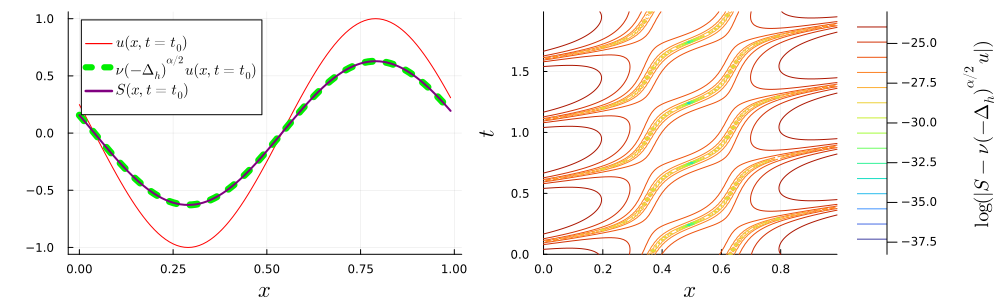

In [3]:
using Plots, LaTeXStrings;
h=0.01
x_vec = 0:h:(1-h)
Δt = 0.01
α = 1.0
t_vec = 0:Δt:(2-Δt)
ν = 0.1
t_n_index = 80 #Int(length(t_vec)/2)
u_test = [cos(2*pi*(x-t)) for x in x_vec, t in t_vec]

DPL_mat = ν * create_DPL_matrix(length(x_vec), α, h, 500)
u_sample = u_test[:, t_n_index]

FL_sample = DPL_mat * u_sample
FL_mat = DPL_mat * u_test
mval = maximum(FL_sample)

surrogate_FL = [mval*cos(2*pi*(x-t)) for x in x_vec, t in t_vec] # creating a surrogate
surro_sample = surrogate_FL'[t_n_index, :]


p2 = plot(x_vec, u_sample, label=L"u(x, t= t_0 )", xlabel=L"x", legendfontsize=10, color=:red, labelfontsize=15)
p2 = plot!(x_vec, FL_sample, label=L"\nu(-\Delta_h)^{\alpha/2}u(x, t=t_0)", ls =:dot, lw=7, color=:green2)
p2 = plot!(x_vec, surro_sample, label=L"S(x, t= t_0)", color=:purple, lw=2, size=(500, 300))
p1 = plot(x_vec, t_vec, log.(abs.(surrogate_FL' - FL_mat')), label=L"S(x, t_0) - \nu(-\Delta_h)^{\alpha/2}u", xlabel=L"x", labelfontsize=15, size=(500, 300), colorbar_titlefontsize=13,
ylabel=L"t", right_margin = 10Plots.mm,  color=:turbo, colorbar_title="\n" *L"\log(|S - \nu(-\Delta_h)^{\alpha/2}u|)",     ytickfontsize = 8,)
p3 = plot(p2, p1, layout=2, size=(1000, 300), left_margin = 5Plots.mm, bottom_margin=4Plots.mm,bbox_inches="tight")
# savefig("../../../Oppgaven/figures/HJB_verification_surrogate2.pdf")

We will now choose a testfunction

$$
u(x,t) = \cos(2\pi(x-t)),
$$
which is a testfunction on the domain. To calculate $f(x,t)$, we calculate
$$
\partial_t u = \partial_t \cos(2\pi(x-t)) = 2\pi\sin(2\pi(x-t)),
$$
we found a surrogate function matching for $\nu = 0.1$, $\alpha=1.0$,
$$
0.1(-\Delta)^{\frac12} u(x,t) = c_0 \cos(2\pi(x-t)), \quad c_0 \simeq 0.628.
$$
Furthermore, we have
$$
H(x, Du) = |\partial_x u|^2 = | -2 \pi \sin(2\pi(x-t)) |^2 = 4 \pi^2 \sin^2(2\pi(x-t)).
$$
Therefore, we have that the RHS is
$$
f(x,t) =: \partial_t u + 0.1(-\Delta)^{\frac12} u + H(x, Du)  = 2\pi\sin(2\pi(x-t)) + c_0 \cos(2\pi(x-t)) + 4 \pi^2 \sin^2(2\pi(x-t)),
$$
and the terminal condition is
$$
u(x,0) = \cos(2\pi(x)).
$$
We end up with the following system, which we are going to solve with our solver:
\begin{equation*}
\begin{cases}
u_t + \nu(-\Delta)^{\frac{\alpha}{2}} + H(x, Du) = 2\pi\sin(2\pi(x-t)) + c_0 \cos(2\pi(x-t)) + 4 \pi^2 \sin^2(2\pi(x-t)) \\
u(x, 0) = \cos(2\pi(x))
\end{cases}
\end{equation*}


---------
The code below takes quite a while, as we use a non-linear solver for small step-sizes. One can increase the stepsizes and get similar results, however with greater errors.

In [11]:
#### NB, this cell takes quite a while to run.
α=1.0
h=0.0001;
x_vec = 0:h:(1-h);
N_h =length(x_vec);
Δt = 0.0001
t_vec = 0:Δt:(2-Δt)
N_T =length(t_vec)
ν=0.1
num_it_HJB=15
R=10
U_mat = HJB_solve(num_it_HJB, x_vec, N_h, Δt, N_T, h, ν, α, 100);
u_test = [cos(2*pi*(x-t)) for x in x_vec, t in t_vec];
############################

"U_num.csv"

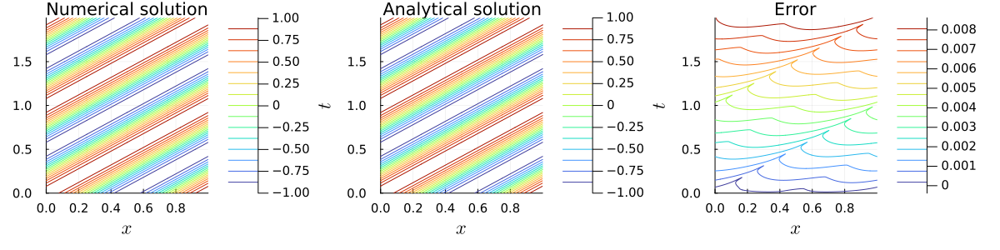

In [9]:
u_test_sparse = u_test[1:5:end, 1:5:end] # we sparse it down to reduce the plotting time. Unneccesary for smaller stepsizes
U_mat_sparse = U_mat[1:5:end, 1:5:end];
x_vec_sparse = x_vec[1:5:end]
t_vec_sparse = t_vec[1:5:end];

using Plots, LaTeXStrings;
p1 = plot(x_vec_sparse, t_vec_sparse, U_mat_sparse', xlabel=L"x", ylabel=L"t", size=(400, 350), left_margin = 0Plots.mm, right_margin = 6Plots.mm, color=:turbo, bottom_margin=10Plots.mm,
labelfontsize=15, tickfontsize=10, title="Numerical solution")
p2 = plot(x_vec_sparse, t_vec_sparse, u_test_sparse', xlabel=L"x", ylabel=L"t",  size=(400, 350), left_margin = 0Plots.mm, right_margin = 6Plots.mm, color=:turbo, bottom_margin=10Plots.mm,
labelfontsize=15, tickfontsize=10, title="Analytical solution")
p3 = plot(x_vec_sparse, t_vec_sparse, U_mat_sparse' - u_test_sparse' , xlabel=L"x", ylabel=L"t", size=(400, 350), left_margin = 0Plots.mm, right_margin = 5Plots.mm, color=:turbo,
labelfontsize=15, tickfontsize=10, title="Error")
plot(p1, p2, p3, layout = (1,3), size = (1200, 300))